<a href="https://colab.research.google.com/github/npinto97/AmodalShapeCompletion/blob/main/Copia_di_Light_2_Step_Amodal_Shape_Completion_fin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

CV project, a.y. 2023-24

* Nicolas Pinto,  807348
* Emanuele Tanzi, 807406

# **Light 2-Step Amodal Shape Completion**

Amodal shape completion is a crucial problem in computer vision, which involves completing the shape of an object that is partially occluded. In other words, the goal is to predict the entire silhouette of an object, including the parts that are not visible due to occlusion by other objects.

In our project, named *Light 2-Step Amodal Shape Completion*, we propose a two-step approach to solve the problem of amodal shape completion. The main idea is to segment the amodal shape of the object through two consecutive steps:

1. Occlusion Mask Prediction: In the first phase, we use the modal mask, which is the visible part of the occluded object in the image, to predict the occlusion mask, representing the non-visible part of the object. This allows us to isolate the areas of the object that are hidden from view.

2. Amodal Mask Prediction: In the second phase, we use the occlusion mask obtained in the first step to identify the occlusion boundaries. These boundaries, along with the modal mask, are used to generate the complete amodal mask, which represents the entire silhouette of the object.

We evaluated two distinct models for this approach: one based on UNet, known for its effectiveness in image segmentation, and the other based on CNN, a type of deep neural network particularly suited for extracting complex visual features.

## Installations

In [1]:
# Installing useful libraries

!pip install pycocotools
!pip install torch torchvision
!pip install opencv-python
!pip install ipdb
!pip install albumentations

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

## Dataset extraction

For this project, we utilized the COCOA (Common Object in COntext Amodal) dataset, which is commonly employed for amodal segmentation tasks. The COCO Amodal (COCOA) dataset extends the COCO dataset by providing additional annotations for amodal masks. So, it includes both modal and amodal annotations for various objects in different scenes.

* The dataset is available here: https://data.dgl.ai/dataset/C2F-Seg/COCOA.tar

The dataset is composed of two folders of images, which were used for training and testing, respectively. Alongside these images, the dataset includes annotations that contain information regarding both modal masks (the visible parts of occluded objects) and invisible masks (the occluded shape of objects).

### Downloading and importing dataset and utils

To extract masks from the annotations and apply them to the images, we used the pycocotools library. Pycocotools is a Python library designed to work with COCO annotations. It provides functions to handle the annotation data, making it easier to manipulate and utilize for tasks such as segmentation.

In [2]:
# useful imports for managing images

import os
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import cv2
from PIL import Image

In [3]:
# Downloading and unpacking COCOA dataset

!bash -c download.sh COCOA
!wget https://data.dgl.ai/dataset/C2F-Seg/COCOA.tar
!tar -xvf COCOA.tar

file_path = '/content/COCOA.tar'
os.remove(file_path)  # once unpacked, remove COCOA.tar

Streaming output truncated to the last 5000 lines.
COCOA/train2014/COCO_train2014_000000215582.jpg
COCOA/train2014/COCO_train2014_000000197573.jpg
COCOA/train2014/COCO_train2014_000000271301.jpg
COCOA/train2014/COCO_train2014_000000041577.jpg
COCOA/train2014/COCO_train2014_000000513105.jpg
COCOA/train2014/COCO_train2014_000000247547.jpg
COCOA/train2014/COCO_train2014_000000444344.jpg
COCOA/train2014/COCO_train2014_000000135258.jpg
COCOA/train2014/COCO_train2014_000000311412.jpg
COCOA/train2014/COCO_train2014_000000330524.jpg
COCOA/train2014/COCO_train2014_000000500537.jpg
COCOA/train2014/COCO_train2014_000000214589.jpg
COCOA/train2014/COCO_train2014_000000450996.jpg
COCOA/train2014/COCO_train2014_000000316154.jpg
COCOA/train2014/COCO_train2014_000000075821.jpg
COCOA/train2014/COCO_train2014_000000431200.jpg
COCOA/train2014/COCO_train2014_000000426469.jpg
COCOA/train2014/COCO_train2014_000000509030.jpg
COCOA/train2014/COCO_train2014_000000163525.jpg
COCOA/train2014/COCO_train2014_000000

In [4]:
# Importing cocoapi library (for managing COCOA dataset)

!git clone https://github.com/cocodataset/cocoapi.git

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

!python /content/cocoapi/PythonAPI/setup.py build_ext --inplace

Cloning into 'cocoapi'...
remote: Enumerating objects: 975, done.
remote: Total 975 (delta 0), reused 0 (delta 0), pack-reused 975
Receiving objects: 100% (975/975), 11.72 MiB | 15.25 MiB/s, done.
Resolving deltas: 100% (576/576), done.
running build_ext
Traceback (most recent call last):
  File "/content/cocoapi/PythonAPI/setup.py", line 16, in <module>
    setup(
  File "/usr/local/lib/python3.10/dist-packages/setuptools/__init__.py", line 107, in setup
    return distutils.core.setup(**attrs)
  File "/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/core.py", line 185, in setup
    return run_commands(dist)
  File "/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/core.py", line 201, in run_commands
    dist.run_commands()
  File "/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/dist.py", line 969, in run_commands
    self.run_command(cmd)
  File "/usr/local/lib/python3.10/dist-packages/setuptools/dist.py", line 1244, in run_command
    super().r

### Extracting informations from dataset

To leverage the COCOA dataset for our project, we performed a series of steps to extract the necessary information. The primary goal was to obtain the visible and occlusion masks from the annotations and then use these masks to create the amodal masks.

In particular, we ensured to:

*   Load the annotations
*   Extract visible masks
* Extract occlusion masks
* Identify the occlusion boundary by using visible and occlusion masks
* Generating amodal masks by using visible and occlusion masks

Additionally, we ensured that only images with both modal and amodal annotations were included in our dataset. This step was critical to guarantee that our models had the necessary data for training and testing. Images without these annotations were excluded to maintain the quality and relevance of the dataset.

In [5]:
# useful imports for managing and displaying images

import json
from collections import defaultdict
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import pycocotools.mask as maskUtils
from skimage import io

In [6]:
# defining the directories to the annotation files

train_annFile = '/content/COCOA/COCO_amodal_train2014_with_classes.json'
test_annFile = '/content/COCOA/COCO_amodal_val2014_with_classes.json'

In [7]:
# creating functions to help the dataset loading

# extracting visible mask using the image id and the corresponding annotation
def get_visible_mask(image_id, ann, coco):

    img = coco.loadImgs(image_id)[0]
    visible_mask = maskUtils.decode(ann['visible_mask'])

    return visible_mask


# extracting occlusion mask using the image id and the correpsonding annotation
def get_occlusion_mask(image_id, ann, coco):

    img = coco.loadImgs(image_id)[0]
    occlusion_mask = maskUtils.decode(ann['invisible_mask'])

    return occlusion_mask


# extracting occlusion bonundary using the corresponding visible and occlusion mask
def get_occlusion_boundary(visible_mask, occlusion_mask, dilation_size=2):
    visible_mask = visible_mask.astype(np.uint8)
    occlusion_mask = occlusion_mask.astype(np.uint8)

    kernel = np.ones((dilation_size, dilation_size), np.uint8)

    visible_dilated = cv2.dilate(visible_mask, kernel, iterations=1)
    occlusion_dilated = cv2.dilate(occlusion_mask, kernel, iterations=1)

    boundary_mask = cv2.bitwise_and(visible_dilated, occlusion_dilated)

    return boundary_mask


# extracting amodal mask using the corresponding visible and occlusion mask
def get_amodal_mask(visible_mask, occlusion_mask):
    visible_mask = visible_mask.astype(np.uint8)
    occlusion_mask = occlusion_mask.astype(np.uint8)

    amodal_mask = cv2.bitwise_or(visible_mask, occlusion_mask)

    return amodal_mask

In [8]:
# function for defining a dictionary storing the couples <image_id, annotations>
def create_image_annotations_dict(annotation_file):
    with open(annotation_file, 'r') as f:
        coco_data = json.load(f)

    image_annotations_count = defaultdict(int)

    for ann in coco_data['annotations']:
        image_id = ann['image_id']
        image_annotations_count[image_id] += 1

    return image_annotations_count


# function for extracting useful elements from the dictionary, inserting them into a list
def get_annotations_list(annFile, annotations_dict):
  with open(annFile, 'r') as f:
    coco_data = json.load(f)

  annotations_list = []
  for ann in coco_data['annotations']:
    if 'visible_mask' in ann and 'invisible_mask' in ann:
      annotations_list.append(ann['image_id'])

  return list(set(annotations_list)) # eliminate duplicates

In [9]:
# definition of train and test annotations dictionaries
train_annotations_dict = create_image_annotations_dict(train_annFile)
test_annotations_dict = create_image_annotations_dict(test_annFile)

# definition of train and test annotations lists
train_annotations_list = get_annotations_list(train_annFile, train_annotations_dict)
test_annotations_list = get_annotations_list(test_annFile, test_annotations_dict)

### Building Dataset and DataLoader

In this phase of the project, we utilized previously defined functions and the ImageData class to structure and organize the dataset. The ImageData class was specifically created to encapsulate all relevant information for each image, including the image ID, annotation index, modal mask, occlusion mask, occlusion boundary, and amodal mask.

The COCOADataset class was designed to further process and manage the dataset efficiently. This class serves two main purposes:

1. Filtering Based on Occlusion Area: To ensure the relevance of the dataset, the COCOADataset class removes all images where the occluded objects have a total surface area below 1% of the entire image (equivalent to 655 pixels). This filtering step ensures that only significant occlusions are considered, which is crucial for the amodal shape completion task.

2. Data Augmentation: To enrich the dataset and enhance the training process, data augmentation techniques are applied. These augmentations include image flipping and adjustments to brightness and contrast. Augmentations help create a more diverse set of training examples, which can improve the robustness and performance of the model.



In [10]:
# importing torch libraries

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import ImageOps, ImageEnhance
import random

In [11]:
# class for managing all the information linked to an instance of the dataset, obtainable from image id and annotations

class ImageData:
    def __init__(self, image_id, index_ann, modal_mask, occlusion_mask, occlusion_boundary, amodal_mask):
      self.image_id = image_id
      self.index_ann = index_ann
      self.modal_mask = modal_mask
      self.occlusion_mask = occlusion_mask
      self.occlusion_boundary = occlusion_boundary
      self.amodal_mask = amodal_mask

    def get_image_id(self):
        return self.image_id

    def get_index_ann(self):
        return self.index_ann

    def get_modal_mask(self):
        return self.modal_mask

    def get_occlusion_mask(self):
      return self.occlusion_mask

    def get_occlusion_boundary(self):
      return self.occlusion_boundary

    def get_amodal_mask(self):
      return self.amodal_mask

In [12]:
# functions for a safe loading of the Dataset

# resizes all the images to a specific shape
def resize_mask(mask, target_size):
    return np.array(Image.fromarray(mask).resize(target_size, Image.NEAREST))


# groups all the extractable informations for an instance in a single variable mask_info
def save_masks(input_images_dir, annotations_list, annotations_dict, coco, target_size):
    masks_info = []

    for image_id in annotations_list:
        img = coco.loadImgs(image_id)[0]
        image_path = os.path.join(input_images_dir, img['file_name'])

        image = Image.open(image_path)

        n_anns = annotations_dict.get(image_id, 0)

        for i_anns in range(n_anns):
            ann_id = coco.getAnnIds(imgIds=image_id)[i_anns]
            ann = coco.loadAnns(ann_id)[0]

            if 'visible_mask' in ann and 'invisible_mask' in ann:
                visible_mask = get_visible_mask(image_id, ann, coco)
                occlusion_mask = get_occlusion_mask(image_id, ann, coco)
                occlusion_boundary = get_occlusion_boundary(visible_mask, occlusion_mask)
                amodal_mask = get_amodal_mask(visible_mask, occlusion_mask)

                # Resizing images
                visible_mask = resize_mask(visible_mask, target_size)
                occlusion_mask = resize_mask(occlusion_mask, target_size)
                occlusion_boundary = resize_mask(occlusion_boundary, target_size)
                amodal_mask = resize_mask(amodal_mask, target_size)

                masks_info.append(ImageData(image_id, ann_id, visible_mask, occlusion_mask, occlusion_boundary, amodal_mask))

    return masks_info


# other utils functions

def get_train_image_path(image_id):
  return os.path.join(train_path, f'COCO_train2014_{image_id:012d}{image_extension}')

def get_test_image_path(image_id):
  return os.path.join(test_path, f'COCO_val2014_{image_id:012d}{image_extension}')

def get_image_path(image_id, mode):
  if mode=='train':
    return get_train_image_path(image_id)
  if mode=='test':
    return get_test_image_path(image_id)

def get_mode(path):
  if path==train_path:
    return 'train'
  if path==test_path:
    return 'test'

def load_image(image_path):
  img = Image.open(image_path).convert("RGB")
  img = img.resize(input_shape)
  return img

In [13]:
# Saving train and test masks info

train_coco = COCO(train_annFile)
test_coco = COCO(test_annFile)
train_path = '/content/COCOA/train2014'
test_path = '/content/COCOA/val2014'
input_shape = (256, 256)

train_masks_info = save_masks(train_path, train_annotations_list, train_annotations_dict, train_coco, input_shape)
test_masks_info = save_masks(test_path, test_annotations_list, test_annotations_dict, test_coco, input_shape)

loading annotations into memory...
Done (t=0.20s)
creating index...
index created!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


In [14]:
image_extension = '.jpg'

transform = transforms.Compose([
    transforms.Resize(input_shape),
    transforms.ToTensor()
])  # from image to tensor

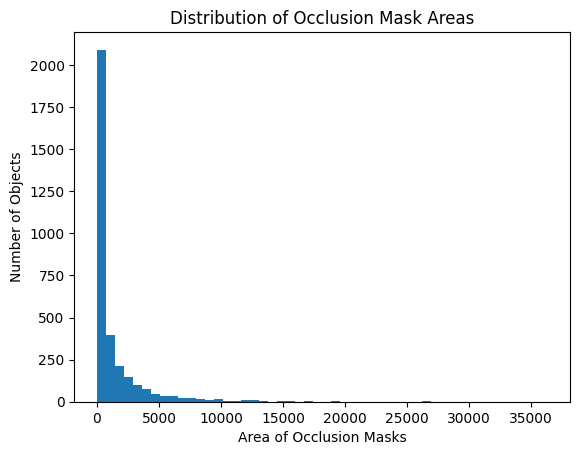

In [15]:
# showing  the distribution of occlusion mask areas

import matplotlib.pyplot as plt

def analyze_occlusion_areas(mask_info_list):
    areas = [torch.tensor(mask_info.get_occlusion_mask(), dtype=torch.float32).sum().item()
             for mask_info in mask_info_list]

    plt.hist(areas, bins=50)
    plt.xlabel('Area of Occlusion Masks')
    plt.ylabel('Number of Objects')
    plt.title('Distribution of Occlusion Mask Areas')
    plt.show()

analyze_occlusion_areas(train_masks_info)


In [16]:
# COCOADataset class

class COCOADataset(Dataset):
    def __init__(self, image_folder, mask_info_list, occlusion_threshold, transform=None):
        self.image_folder = image_folder
        self.transform = transform
        self.augmentations = ['original', 'flipped', 'brightness_contrast']
        self.occlusion_threshold = occlusion_threshold

        # Filter mask_info_list based on the occlusion_threshold
        self.mask_info_list = [mask_info for mask_info in mask_info_list
                               if self._is_occlusion_above_threshold(mask_info)]

    def _is_occlusion_above_threshold(self, mask_info):
        occlusion_mask = torch.tensor(mask_info.get_occlusion_mask(), dtype=torch.float32)
        occlusion_area = occlusion_mask.sum().item()
        return occlusion_area > self.occlusion_threshold

    def __len__(self):
        return len(self.mask_info_list) * len(self.augmentations)

    def __getitem__(self, idx):
        # Determine the actual index and augmentation type
        mask_info_idx = idx // len(self.augmentations)
        augmentation_type = self.augmentations[idx % len(self.augmentations)]

        mask_info = self.mask_info_list[mask_info_idx]
        image_id = mask_info.get_image_id()
        mode = get_mode(self.image_folder)
        image_path = get_image_path(image_id, mode=mode)
        image = Image.open(image_path).convert('RGB')

        modal_mask = torch.tensor(mask_info.get_modal_mask(), dtype=torch.float32).unsqueeze(0)
        occlusion_mask = torch.tensor(mask_info.get_occlusion_mask(), dtype=torch.float32).unsqueeze(0)
        occlusion_boundary = torch.tensor(mask_info.get_occlusion_boundary(), dtype=torch.float32).unsqueeze(0)
        amodal_mask = torch.tensor(mask_info.get_amodal_mask(), dtype=torch.float32).unsqueeze(0)

        if augmentation_type == 'flipped':
            image = ImageOps.mirror(image)
            modal_mask = torch.flip(modal_mask, [2])
            occlusion_mask = torch.flip(occlusion_mask, [2])
            occlusion_boundary = torch.flip(occlusion_boundary, [2])
            amodal_mask = torch.flip(amodal_mask, [2])
        elif augmentation_type == 'brightness_contrast':
            brightness_factor = random.uniform(0.5, 1.5)
            contrast_factor = random.uniform(0.5, 1.5)
            image = ImageEnhance.Brightness(image).enhance(brightness_factor)
            image = ImageEnhance.Contrast(image).enhance(contrast_factor)

        if self.transform:
            image = self.transform(image)

        return image, modal_mask, occlusion_mask, occlusion_boundary, amodal_mask

In [17]:
#train_dataset = COCOADataset(train_path, train_masks_info, transform=transform)
train_dataset = COCOADataset(train_path, train_masks_info, occlusion_threshold=655, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)

#test_dataset = COCOADataset(test_path, test_masks_info, transform=transform)
test_dataset = COCOADataset(test_path, test_masks_info, occlusion_threshold=655, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=True)

### Visualization of the dataset content

In [18]:
# function to print image and masks

def show_sample(image, modal_mask, occlusion_mask, occlusion_boundary_mask, amodal_mask):
    fig, axs = plt.subplots(1, 5, figsize=(15, 5))
    axs[0].imshow(image.permute(1, 2, 0))
    axs[0].set_title('Image')
    axs[1].imshow(modal_mask.squeeze(0), cmap='gray')
    axs[1].set_title('Modal Mask')
    axs[2].imshow(occlusion_mask.squeeze(0), cmap='gray')
    axs[2].set_title('Occlusion Mask')
    axs[3].imshow(occlusion_boundary_mask.squeeze(0), cmap='gray')
    axs[3].set_title('Occlusion Boundary Mask')
    axs[4].imshow(amodal_mask.squeeze(0), cmap='gray')
    axs[4].set_title('Amodal Mask')
    for ax in axs:
        ax.axis('off')
    plt.show()


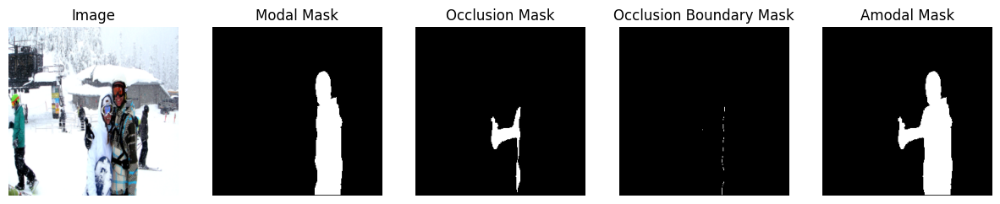

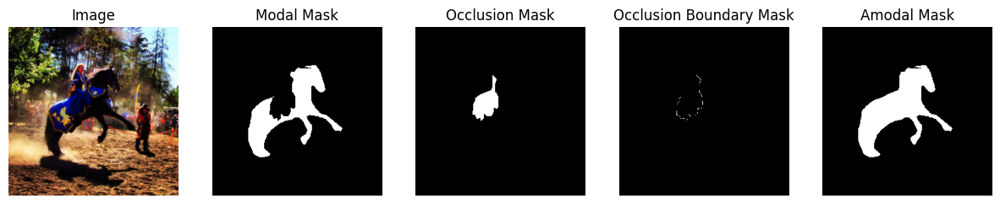

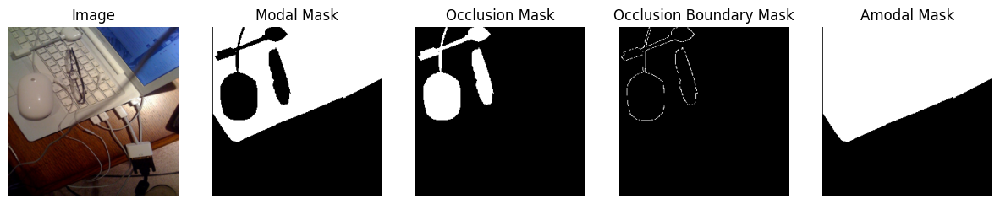

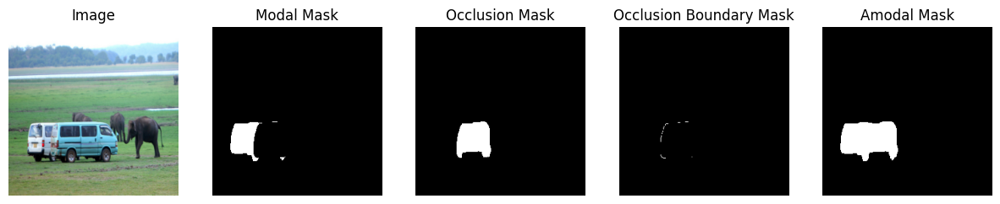

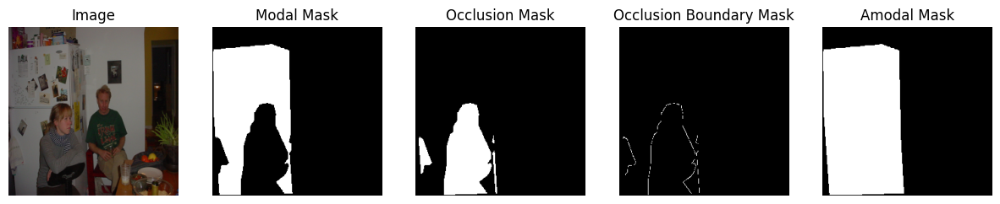

In [19]:
# checking train dataset

for i, (images, modal_masks, occlusion_masks, occlusion_boundary, amodal_masks) in enumerate(train_loader):

    if i == 0:

        for j in range(min(len(images), 5)):
            show_sample(images[j], modal_masks[j], occlusion_masks[j], occlusion_boundary[j], amodal_masks[j])
        break

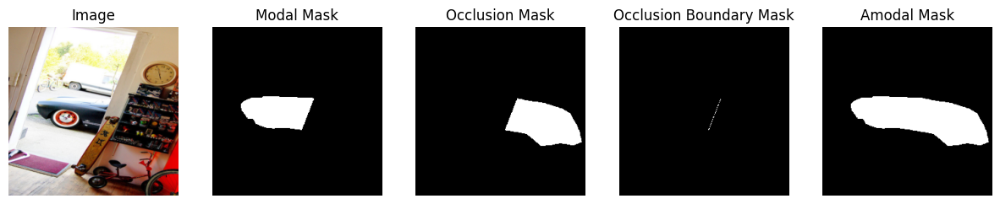

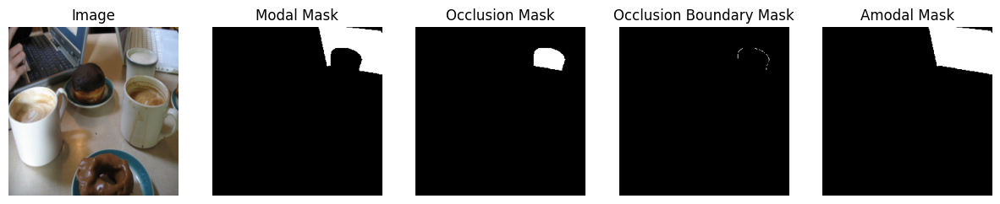

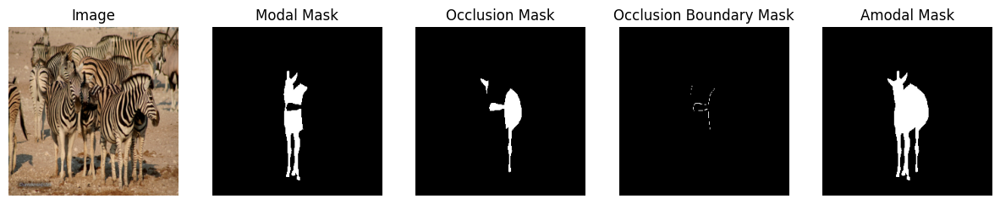

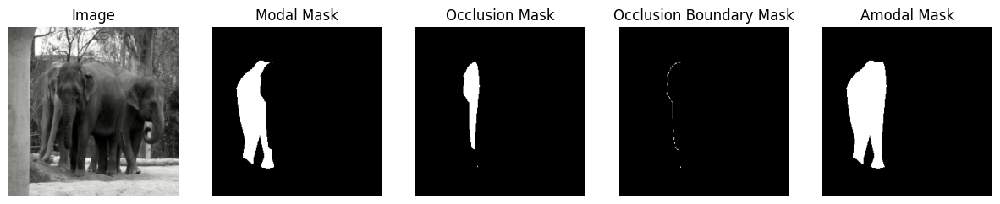

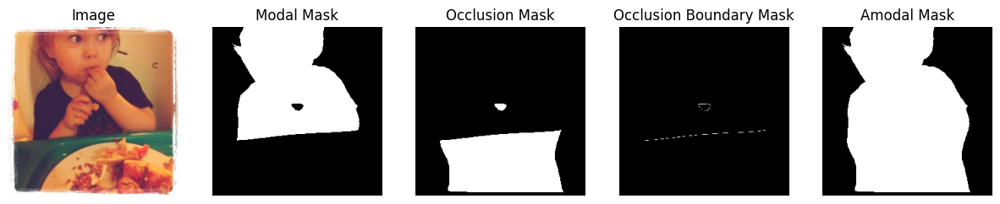

In [20]:
# checking test dataset

for i, (images, modal_masks, occlusion_masks, occlusion_boundary, amodal_masks) in enumerate(test_loader):

    if i == 0:

        for j in range(min(len(images), 5)):
            show_sample(images[j], modal_masks[j], occlusion_masks[j], occlusion_boundary[j], amodal_masks[j])
        break

## U-Net based approach

UNet was chosen for our approach due to its effective structure for image segmentation, which leverages a series of skip connections to combine low-level and high-level information. This architecture allows for detailed and accurate segmentations, essential for precisely predicting occlusion and amodal masks. UNet's ability to handle various levels of detail makes it particularly suitable for completing occluded shapes, thus ensuring high performance in our experiments​.

* The idea of using U-Net, and in general for our approach, cames from the paper  "[Amodal Ground Truth and Completion in the Wild](https://arxiv.org/pdf/2312.17247)".

### Amodal Occlusion

In [21]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import models
from torchvision.models import resnet18
from torch.utils.data import DataLoader, SubsetRandomSampler

#### Defining Loss Function

We chose to employ a combination of DiceLoss and BCELoss for training due to their complementary advantages:

* BCELoss is effective for pixel-wise binary classification tasks, making it suitable for segmenting each pixel as part of the object or the background. Moreover, provides smooth gradients, aiding in stable and effective training of deep neural networks, especially in imbalanced class scenarios.

* DiceLoss focuses on the overlap between the predicted and ground truth masks, directly optimizing segmentation performance by emphasizing critical regions. Moreover, it effectively handles class imbalance, common in segmentation tasks where the object may occupy a small fraction of the image.

Combining BCELoss and DiceLoss leverages the strengths of both losses. BCELoss ensures accurate pixel-wise classification, while DiceLoss enhances the overall overlap between predicted and true masks. Such function leads to improved convergence during training, benefiting from the stability of BCELoss and the region-focused optimization of DiceLoss.

In [22]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, preds, targets):
        preds = torch.sigmoid(preds)
        num = targets.size(0)
        preds = preds.view(num, -1)
        targets = targets.view(num, -1)
        intersection = (preds * targets).sum()
        dice = (2. * intersection + self.smooth) / (preds.sum() + targets.sum() + self.smooth)
        return 1 - dice

class BCEDiceLoss(nn.Module):
    def __init__(self):
        super(BCEDiceLoss, self).__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = DiceLoss()

    def forward(self, preds, targets):
        bce_loss = self.bce(preds, targets)
        dice_loss = self.dice(preds, targets)
        return bce_loss + dice_loss

#### Defining the UNet module for amodal occlusion

There, it is defined the UNet architecture for finding the occlusion mask starting from the modal mask.

In [23]:
class double_conv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class inconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(inconv, self).__init__()
        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x):
        return self.conv(x)

class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.mpconv = nn.Sequential(
            nn.MaxPool2d(2),
            double_conv(in_ch, out_ch)
        )

    def forward(self, x):
        return self.mpconv(x)

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch // 2, in_ch // 2, kernel_size=2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class outconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(outconv, self).__init__()
        self.conv = nn.Conv2d(in_ch, out_ch, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

class up_final(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up_final, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2)
        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1):
        x1 = self.up(x1)
        return self.conv(x1)


In [24]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes

        self.inc = inconv(n_channels, 64)
        self.down1 = down(64, 128)
        self.down2 = down(128, 256)
        self.down3 = down(256, 512)
        self.down4 = down(512, 1024)

        self.image_encoder = models.resnet18(pretrained=True)
        self.image_encoder = nn.Sequential(*list(self.image_encoder.children())[:-2])
        self.reduce_dim = nn.Conv2d(512, 1024, kernel_size=1)

        self.up1 = up(2048, 512)
        self.up2 = up(1024, 256)
        self.up3 = up(512, 128)
        self.up4 = up(256, 64)
        self.outc = outconv(128, n_classes)

    def forward(self, image, modal_mask):
        x = torch.cat([image, modal_mask], dim=1)
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        img_feat = self.image_encoder(image)
        img_feat = self.reduce_dim(img_feat)

        #print(f"x5: {x5.shape}, img_feat: {img_feat.shape}")

        x = self.up1(x5, img_feat)
        #print(f"up1: {x.shape}")
        x = self.up2(x, x4)
        #print(f"up2: {x.shape}")
        x = self.up3(x, x3)
        #print(f"up3: {x.shape}")
        x = self.up4(x, x2)
        #print(f"up4: {x.shape}")

        # Upsample one more time to match the spatial dimensions of x1
        x = F.interpolate(x, size=x1.size()[2:], mode='bilinear', align_corners=True)
        #print(f"after interpolate: {x.shape}")

        x = torch.cat([x, x1], dim=1)  # Concatenate with the input feature map
        output = self.outc(x)
        return output


#### Training

In [25]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_UNet = UNet(n_channels=4, n_classes=1).to(device)

criterion = BCEDiceLoss()

#optimizer = optim.Adam(model_UNet.parameters(), lr=0.001, weight_decay=1e-2)
optimizer = optim.Adam(model_UNet.parameters(), lr=0.001)

num_epochs = 20

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 192MB/s]


In [26]:
def train(model, train_loader, criterion, optimizer, device, epoch):
    model_UNet.train()
    running_loss = 0.0
    for batch_idx, batch in enumerate(train_loader):
        images, modal_masks, occlusion_masks, occlusion_boundary, amodal_masks = [item.to(device) for item in batch]

        optimizer.zero_grad()
        outputs = model_UNet(images, modal_masks)
        loss = criterion(outputs, occlusion_masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if batch_idx % 10 == 9:
            print(f'Epoch [{epoch + 1}], Batch [{batch_idx + 1}/{len(train_loader)}], Loss: {loss.item():.4f}')

    return running_loss / len(train_loader)

for epoch in range(num_epochs):
    epoch_loss = train(model_UNet, train_loader, criterion, optimizer, device, epoch)
    print(f'Epoch {epoch + 1}/{num_epochs} completed. Average Loss: {epoch_loss:.4f}')

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch [1], Batch [10/238], Loss: 1.2786
Epoch [1], Batch [20/238], Loss: 1.1528
Epoch [1], Batch [30/238], Loss: 1.0322
Epoch [1], Batch [40/238], Loss: 0.9978
Epoch [1], Batch [50/238], Loss: 0.9143
Epoch [1], Batch [60/238], Loss: 0.8803
Epoch [1], Batch [70/238], Loss: 0.7487
Epoch [1], Batch [80/238], Loss: 0.7047
Epoch [1], Batch [90/238], Loss: 0.7811
Epoch [1], Batch [100/238], Loss: 0.7880
Epoch [1], Batch [110/238], Loss: 0.8504
Epoch [1], Batch [120/238], Loss: 0.6940
Epoch [1], Batch [130/238], Loss: 0.7702
Epoch [1], Batch [140/238], Loss: 0.7507
Epoch [1], Batch [150/238], Loss: 0.7969
Epoch [1], Batch [160/238], Loss: 0.7098
Epoch [1], Batch [170/238], Loss: 0.7524
Epoch [1], Batch [180/238], Loss: 0.7047
Epoch [1], Batch [190/238], Loss: 0.7426
Epoch [1], Batch [200/238], Loss: 0.7975
Epoch [1], Batch [210/238], Loss: 0.6591
Epoch [1], Batch [220/238], Loss: 0.7108
Epoch [1], Batch [230/238], Loss: 0.7825
Epoch 1/20 completed. Average Loss: 0.8131
Epoch [2], Batch [10/23

In [27]:
torch.save(model_UNet.state_dict(), 'model_occlusion.pth')

#### Testing

For the evaluation, in both amodal occlusion and amodal segmentation, we employed three key metrics: mean Intersection over Union (mIoU), Dice Coefficient, and Inverse Mean IoU.

* Mean Intersection over Union, that provides a ratio that indicates how well the predicted segmentation matches the actual object is a standard metric in segmentation tasks because it balances both false positives and false negatives, giving a comprehensive view of the model's accuracy.

* Dice Coefficient, a measure of overlap that is calculated as twice the area of overlap between the predicted and ground truth masks, divided by the total number of pixels in both masks, is particularly sensitive to the presence of small objects and regions within the segmentation, making it useful for ensuring that even finer details are accurately captured.

* Inverse Mean over Union, that provides a different perspective by focusing on the errors made by the model, helps in understanding the proportion of the segmentation that is not accurate, thus offering insights into areas needing improvement.

In [28]:
import torch

def compute_iou(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    if union == 0:
        return 0.0
    else:
        return intersection / union

def compute_dice(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    intersection = (pred * target).sum()
    dice = (2 * intersection) / (pred.sum() + target.sum())
    if (pred.sum() + target.sum()) == 0:
        return 0.0
    else:
        return dice

def evaluate_model_occlusion(model, test_loader, device):
    model.eval()
    total_iou = 0.0
    total_dice = 0.0
    num_batches = 0

    with torch.no_grad():
        for images, modal_masks, occlusion_masks, occlusion_boundary_masks, amodal_masks in test_loader:
            images = images.to(device)
            modal_masks = modal_masks.to(device)
            occlusion_masks = occlusion_masks.to(device)

            outputs = model(images, modal_masks)
            outputs = torch.sigmoid(outputs)  # applying sigmoid to obtain probabilities

            batch_iou = 0.0
            batch_dice = 0.0
            for i in range(images.size(0)):
                iou = compute_iou(outputs[i], occlusion_masks[i])
                dice = compute_dice(outputs[i], occlusion_masks[i])
                batch_iou += iou
                batch_dice += dice

            total_iou += batch_iou / images.size(0)
            total_dice += batch_dice / images.size(0)
            num_batches += 1

    mean_iou = total_iou / num_batches
    mean_dice = total_dice / num_batches
    inverse_miou = 1 - mean_iou

    print(f'Mean IoU: {mean_iou:.4f}')
    print(f'Mean Dice Coefficient: {mean_dice:.4f}')
    print(f'Inverse Mean IoU: {inverse_miou:.4f}')

    return mean_iou, mean_dice, inverse_miou

In [29]:
mean_iou_UNet, mean_dice_UNet, inverse_miou_UNet = evaluate_model_occlusion(model_UNet, test_loader, device)

Mean IoU: 0.4338
Mean Dice Coefficient: 0.5533
Inverse Mean IoU: 0.5662


#### Visualization

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random

def visualize_predictions(model, test_loader, device, num_samples=5):
    model.eval()
    samples = random.sample(range(len(test_loader.dataset)), num_samples)

    fig, axes = plt.subplots(num_samples, 4, figsize=(20, num_samples * 5))
    if num_samples == 1:
        axes = axes[np.newaxis, :]

    with torch.no_grad():
        for i, idx in enumerate(samples):
            image, modal_mask, occlusion_mask, occlusion_boundary_mask, amodal_mask = test_loader.dataset[idx]
            image = image.to(device).unsqueeze(0)
            modal_mask = modal_mask.to(device).unsqueeze(0)
            occlusion_mask = occlusion_mask.to(device).unsqueeze(0)
            amodal_mask = amodal_mask.to(device).unsqueeze(0)

            output = model(image, modal_mask)
            output = torch.sigmoid(output).squeeze().cpu().numpy()

            # Convert tensors to numpy arrays for visualization
            image_np = image.squeeze().permute(1, 2, 0).cpu().numpy()
            modal_mask_np = modal_mask.squeeze().cpu().numpy()
            occlusion_mask_np = occlusion_mask.squeeze().cpu().numpy()
            amodal_mask_np = amodal_mask.squeeze().cpu().numpy()

            axes[i, 0].imshow(image_np)
            axes[i, 0].set_title("Original Image")
            axes[i, 0].axis('off')

            axes[i, 1].imshow(amodal_mask_np, cmap='gray')
            axes[i, 1].set_title("Amodal Mask")
            axes[i, 1].axis('off')

            axes[i, 2].imshow(occlusion_mask_np, cmap='gray')
            axes[i, 2].set_title("Target Occlusion Mask")
            axes[i, 2].axis('off')

            axes[i, 3].imshow(output, cmap='gray')
            axes[i, 3].set_title("Predicted Occlusion Mask")
            axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
visualize_predictions(model_UNet, test_loader, device, num_samples=5)

### Amodal segmentation

#### Defining the UNet module for amodal occlusion

We defined a UNet architecture, similar to that used in the previous step, but specialized in recognizing the amodal mask.

In [ ]:
# Retouching the UNet for the amodal segmentation task

class AmodalUNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(AmodalUNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes

        self.inc = inconv(n_channels, 64)
        self.down1 = down(64, 128)
        self.down2 = down(128, 256)
        self.down3 = down(256, 512)
        self.down4 = down(512, 1024)

        self.image_encoder = models.resnet18(pretrained=True)
        self.image_encoder = nn.Sequential(*list(self.image_encoder.children())[:-2])
        self.reduce_dim = nn.Conv2d(512, 1024, kernel_size=1)

        self.up1 = up(2048, 512)
        self.up2 = up(1024, 256)
        self.up3 = up(512, 128)
        self.up4 = up(256, 64)
        self.outc = outconv(128, n_classes)

    def forward(self, image, modal_mask, occlusion_boundary):
        # Process image with ResNet
        img_feat = self.image_encoder(image)
        img_feat = self.reduce_dim(img_feat)

        # Concatenate modal mask and occlusion boundary
        mask_and_boundary = torch.cat([modal_mask, occlusion_boundary], dim=1)

        # Pass through UNet
        x = torch.cat([image, mask_and_boundary], dim=1)
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5, img_feat)
        x = self.up2(x, x4)
        x = self.up3(x, x3)
        x = self.up4(x, x2)

        # Upsample one more time to match the spatial dimensions of x1
        x = F.interpolate(x, size=x1.size()[2:], mode='bilinear', align_corners=True)
        x = torch.cat([x, x1], dim=1)  # Concatenate with the input feature map
        output = self.outc(x)
        return output

#### Training loop

In [33]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_AmodalUNet = AmodalUNet(n_channels=5, n_classes=1).to(device)

#criterion = nn.BCEWithLogitsLoss()
criterion = BCEDiceLoss()

#optimizer = optim.Adam(model_AmodalUNet.parameters(), lr=0.001, weight_decay=1e-2)
optimizer = optim.Adam(model_AmodalUNet.parameters(), lr=0.001)

num_epochs = 20

In [34]:
def train(model, train_loader, criterion, optimizer, device, epoch):
    model_AmodalUNet.train()
    running_loss = 0.0
    for batch_idx, batch in enumerate(train_loader):
        images, modal_masks, occlusion_masks, occlusion_boundary, amodal_masks = [item.to(device) for item in batch]

        optimizer.zero_grad()
        outputs = model_AmodalUNet(images, modal_masks, occlusion_boundary)
        loss = criterion(outputs, amodal_masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if batch_idx % 10 == 9:
            print(f'Epoch [{epoch + 1}], Batch [{batch_idx + 1}/{len(train_loader)}], Loss: {loss.item():.4f}')

    return running_loss / len(train_loader)

for epoch in range(num_epochs):
    epoch_loss = train(model_AmodalUNet, train_loader, criterion, optimizer, device, epoch)
    print(f'Epoch {epoch + 1}/{num_epochs} completed. Average Loss: {epoch_loss:.4f}')


Epoch [1], Batch [10/238], Loss: 0.5272
Epoch [1], Batch [20/238], Loss: 0.4528
Epoch [1], Batch [30/238], Loss: 0.3004
Epoch [1], Batch [40/238], Loss: 0.3440
Epoch [1], Batch [50/238], Loss: 0.2496
Epoch [1], Batch [60/238], Loss: 0.3688
Epoch [1], Batch [70/238], Loss: 0.2542
Epoch [1], Batch [80/238], Loss: 0.2569
Epoch [1], Batch [90/238], Loss: 0.1878
Epoch [1], Batch [100/238], Loss: 0.1253
Epoch [1], Batch [110/238], Loss: 0.2165
Epoch [1], Batch [120/238], Loss: 0.1910
Epoch [1], Batch [130/238], Loss: 0.2487
Epoch [1], Batch [140/238], Loss: 0.1261
Epoch [1], Batch [150/238], Loss: 0.2043
Epoch [1], Batch [160/238], Loss: 0.1985
Epoch [1], Batch [170/238], Loss: 0.1004
Epoch [1], Batch [180/238], Loss: 0.1341
Epoch [1], Batch [190/238], Loss: 0.1518
Epoch [1], Batch [200/238], Loss: 0.2609
Epoch [1], Batch [210/238], Loss: 0.2136
Epoch [1], Batch [220/238], Loss: 0.1269
Epoch [1], Batch [230/238], Loss: 0.1990
Epoch 1/20 completed. Average Loss: 0.2731
Epoch [2], Batch [10/23

In [ ]:
torch.save(model_AmodalUNet.state_dict(), 'model_amodal.pth')

#### Testing

In [ ]:
import torch

def compute_iou(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    if union == 0:
        return 0.0
    else:
        return intersection / union

def compute_dice(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    intersection = (pred * target).sum()
    dice = (2 * intersection) / (pred.sum() + target.sum())
    if (pred.sum() + target.sum()) == 0:
        return 0.0
    else:
        return dice

def evaluate_model_segmentation(model, test_loader, device):
    model.eval()
    total_iou = 0.0
    total_dice = 0.0
    num_batches = 0

    with torch.no_grad():
        for images, modal_masks, occlusion_masks, occlusion_boundary_masks, amodal_masks in test_loader:
            images = images.to(device)
            modal_masks = modal_masks.to(device)
            occlusion_boundary_masks = occlusion_boundary_masks.to(device)
            amodal_masks = amodal_masks.to(device)

            outputs = model(images, modal_masks, occlusion_boundary_masks)
            outputs = torch.sigmoid(outputs)  # applying sigmoid to obtain probabilities
            binary_outputs = (outputs > 0.5).float()  # applying treshold to obtain a binary mask
            batch_iou = 0.0
            batch_dice = 0.0
            for i in range(images.size(0)):
                iou = compute_iou(binary_outputs[i], amodal_masks[i])
                dice = compute_dice(binary_outputs[i], amodal_masks[i])
                batch_iou += iou
                batch_dice += dice

            total_iou += batch_iou / images.size(0)
            total_dice += batch_dice / images.size(0)
            num_batches += 1

    mean_iou = total_iou / num_batches
    mean_dice = total_dice / num_batches
    inverse_miou = 1 - mean_iou

    print(f'Mean IoU: {mean_iou:.4f}')
    print(f'Mean Dice Coefficient: {mean_dice:.4f}')
    print(f'Inverse Mean IoU: {inverse_miou:.4f}')

    return mean_iou, mean_dice, inverse_miou

In [ ]:
mean_iou_AmodalUNet, mean_dice_AmodalUNet, inverse_miou_AmodalUNet = evaluate_model_segmentation(model_AmodalUNet, test_loader, device)

#### Visualization

In [ ]:

def visualize_amodal_predictions(model, test_loader, device, num_samples=5):
    model.eval()
    samples = random.sample(range(len(test_loader.dataset)), num_samples)

    fig, axes = plt.subplots(num_samples, 3, figsize=(20, num_samples * 5))
    if num_samples == 1:
        axes = axes[np.newaxis, :]

    with torch.no_grad():
        for i, idx in enumerate(samples):
            image, modal_mask, occlusion_mask, occlusion_boundary_mask, amodal_mask = test_loader.dataset[idx]
            image = image.to(device).unsqueeze(0)
            modal_mask = modal_mask.to(device).unsqueeze(0)
            occlusion_boundary_mask = occlusion_boundary_mask.to(device).unsqueeze(0)
            amodal_mask = amodal_mask.to(device).unsqueeze(0)

            output = model(image, modal_mask, occlusion_boundary_mask)
            output = torch.sigmoid(output).squeeze().cpu().numpy()
            output_binary = (output > 0.5).astype(np.uint8)  # Applying threshold

            # Convert tensors to numpy arrays for visualization
            image_np = image.squeeze().permute(1, 2, 0).cpu().numpy()
            amodal_mask_np = amodal_mask.squeeze().cpu().numpy()

            axes[i, 0].imshow(image_np)
            axes[i, 0].set_title("Original Image")
            axes[i, 0].axis('off')

            axes[i, 1].imshow(amodal_mask_np, cmap='gray')
            axes[i, 1].set_title("Amodal Mask (Target)")
            axes[i, 1].axis('off')

            axes[i, 2].imshow(output_binary, cmap='gray')
            axes[i, 2].set_title("Amodal Mask (Predicted)")
            axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
visualize_amodal_predictions(model_AmodalUNet, test_loader, device, num_samples=5)

### Occlusion boundaries computation

Starting with the model trained for amodal occlusion, we obtain the predicted occlusion masks for the test set. These predictions, along with the modal masks, are used to calculate the occlusion boundaries, which are the "borders" between the modal masks and the occlusion masks. These boundaries are crucial for amodal segmentation.

#### Obtaining a new test dataset, contaning the occlusion boundaries computed using the results of the occlusion module

In [40]:
import numpy as np
import cv2
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from copy import deepcopy
import matplotlib.pyplot as plt

In [ ]:
# Loading the model from the file model_occlusion.pth
model_UNet = UNet(n_channels=4, n_classes=1).to(device)
model_UNet.load_state_dict(torch.load('model_occlusion.pth'))
model_UNet.eval()

In [ ]:
def get_occlusion_boundary(visible_mask, occlusion_mask, dilation_size=2):
    visible_mask = visible_mask.astype(np.uint8)
    occlusion_mask = occlusion_mask.astype(np.uint8)

    kernel = np.ones((dilation_size, dilation_size), np.uint8)

    visible_dilated = cv2.dilate(visible_mask, kernel, iterations=1)
    occlusion_dilated = cv2.dilate(occlusion_mask, kernel, iterations=1)

    boundary_mask = cv2.bitwise_and(visible_dilated, occlusion_dilated)

    return boundary_mask

def generate_new_test_dataset(model_occlusion, test_loader, device, dilation_size=2):
    model_occlusion.eval()
    new_dataset = deepcopy(test_loader.dataset)

    with torch.no_grad():
        for idx in range(len(new_dataset)):
            image, modal_mask, occlusion_mask, occlusion_boundary_mask, amodal_mask = new_dataset[idx]

            image = image.unsqueeze(0).to(device)
            modal_mask = modal_mask.unsqueeze(0).to(device)

            # Predicting the occlusion mask
            predicted_occlusion_mask = model_occlusion(image, modal_mask)
            predicted_occlusion_mask = torch.sigmoid(predicted_occlusion_mask).squeeze().cpu().numpy()

            # converting the predicted mask in a binary mask
            predicted_occlusion_mask = (predicted_occlusion_mask > 0.5).astype(np.uint8)

            # Computing the occlusion boundary
            boundary_mask = get_occlusion_boundary(modal_mask.cpu().numpy().squeeze(), predicted_occlusion_mask, dilation_size)

            # Replacing the previous occlusion boundary with the computed one
            new_dataset.mask_info_list[idx // len(new_dataset.augmentations)].occlusion_boundary = boundary_mask

    return new_dataset

In [ ]:
new_test_dataset = generate_new_test_dataset(model_UNet, test_loader, device)

#### Visualization of the predicted occlusion boundaries

In [44]:
def visualize_new_predictions(new_test_dataset, num_samples=5):
    samples = random.sample(range(len(new_test_dataset)), num_samples)

    fig, axes = plt.subplots(num_samples, 5, figsize=(25, num_samples * 5))
    if num_samples == 1:
        axes = axes[np.newaxis, :]

    for i, idx in enumerate(samples):
        image, modal_mask, occlusion_mask, occlusion_boundary_mask, amodal_mask = new_test_dataset[idx]

        axes[i, 0].imshow(np.transpose(image.numpy(), (1, 2, 0)))
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(modal_mask.numpy().squeeze(), cmap='gray')
        axes[i, 1].set_title("Modal Mask")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(amodal_mask.numpy().squeeze(), cmap='gray')
        axes[i, 2].set_title("Amodal Mask (Target)")
        axes[i, 2].axis('off')

        axes[i, 3].imshow(occlusion_mask.numpy().squeeze(), cmap='gray')
        axes[i, 3].set_title("Occlusion Mask (Target)")
        axes[i, 3].axis('off')

        axes[i, 4].imshow(occlusion_boundary_mask.squeeze(), cmap='gray')
        axes[i, 4].set_title("Occlusion Boundary (Predicted)")
        axes[i, 4].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
visualize_new_predictions(new_test_dataset, num_samples=5)

### Final results

Once we have a new test dataset, identical to the original but with the new occlusion boundaries, we apply the model trained for amodal segmentation.

Also in this case, we evaluated the results by using Mean IoU, Mean Dice Coefficient and Inverse Mean IoU.

In [ ]:
# Loading the model from the file model_amodal.pth
model_AmodalUNet = AmodalUNet(n_channels=5, n_classes=1).to(device)
model_AmodalUNet.load_state_dict(torch.load('model_amodal.pth'))
model_AmodalUNet.eval()

In [ ]:
new_test_loader_UNet = DataLoader(new_test_dataset, batch_size=16, shuffle=True)

In [50]:
final_mean_iou_AmodalUNet, final_mean_dice_AmodalUNet, final_inverse_miou_AmodalUNet = evaluate_model_segmentation(model_AmodalUNet, new_test_loader_UNet, device)

Mean IoU: 0.7531
Mean Dice Coefficient: 0.8439
Inverse Mean IoU: 0.2469


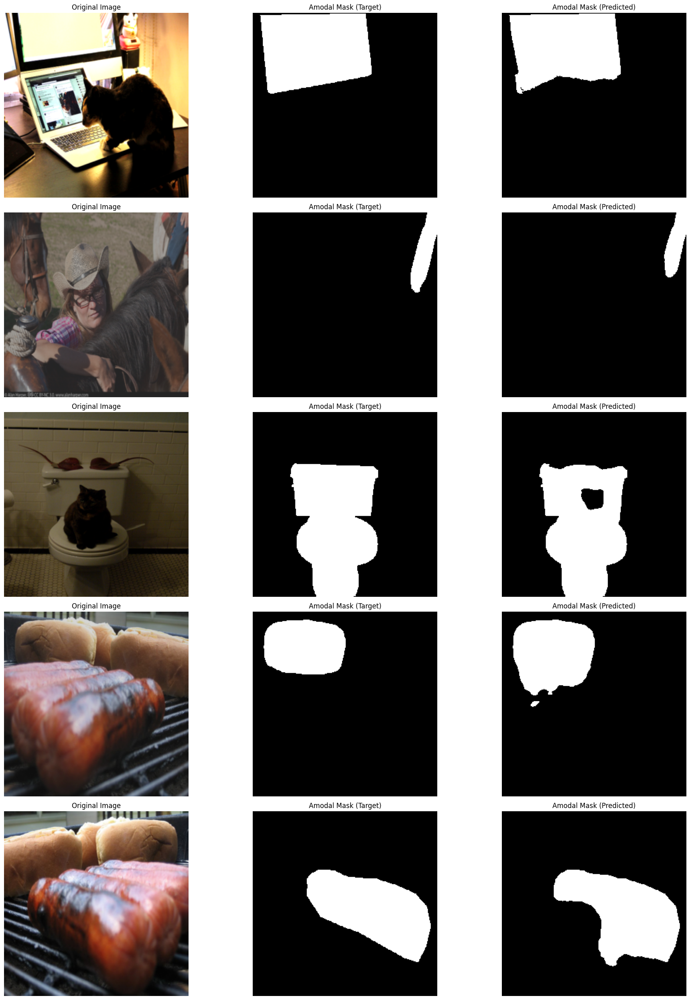

In [51]:
visualize_amodal_predictions(model_AmodalUNet, new_test_loader_UNet, device, num_samples=5)

## CNN-based approach

We employed a CNN-based approach for amodal segmentation. This is the most common approach in the state-of-the-art. There are multiple reasons for which the CNN approach is still valid:

* Simplicity and Efficiency: The SimpleCNN architecture is straightforward and less computationally intensive compared to more complex models, making it faster to train and suitable for scenarios with limited computational resources.

* Strong Feature Extraction: Despite its simplicity, the CNN architecture is capable of extracting powerful features from the input images, thanks to multiple convolutional and pooling layers.

* Effective for Image Processing: CNNs have a proven track record in image processing tasks, including segmentation, due to their ability to capture spatial hierarchies in images.

* Flexibility: The SimpleCNN approach is highly flexible and can be easily adapted to different input modalities and segmentation tasks, making it a versatile choice for our project.

Also in this case we decomposed the amodal segmentation in two steps, that we called amodal occlusion and the amodal segmentation.

### Amodal Occlusion

#### Defining CNN Network

The encoder comprises a series of convolutional layers designed to extract spatial features from the input images. These layers are followed by the ReLU activation function with inplace=True, which introduces non-linearity into the model while optimizing memory usage. To further improve the model's efficiency, MaxPool2d layers are incorporated, reducing the size of the feature maps. This reduction not only increases computational efficiency but also mitigates the risk of overfitting by downsampling the input.

In the decoder, transposed convolutional layers (ConvTranspose2d) are employed to incrementally restore the spatial dimensions of the feature maps to their original size. These layers are complemented by standard convolutional layers, which refine the feature maps at each stage of the decoder. The ReLU activation function is again utilized, adding non-linearity to each layer. This non-linearity is crucial as it enables the network to learn and represent complex patterns within the data.

The forward method begins by concatenating the input image and the modal mask along the color channel using torch.cat. This concatenation allows the network to simultaneously process both the visible parts of the image and the modal mask. The combined data then flows through the encoder, where essential features are extracted. Subsequently, it passes through the decoder, which reconstructs the spatial dimensions to produce the final occlusion mask. This method ensures that the network can effectively predict the occluded regions in the input image.

In [52]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SimpleCNN_Occlusion(nn.Module):
    def __init__(self, n_channels=4, n_classes=1):
        super(SimpleCNN_Occlusion, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(n_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, n_classes, kernel_size=3, padding=1)
        )

    def forward(self, image, modal_mask):
        x = torch.cat([image, modal_mask], dim=1)
        x = self.encoder(x)
        x = self.decoder(x)
        return x

#### Training

In [53]:
model_CNN_Occlusion = SimpleCNN_Occlusion(n_channels=4, n_classes=1).to(device)
#optimizer_occlusion = torch.optim.AdamW(model_CNN_Occlusion.parameters(), lr=1e-4, weight_decay=1e-2)
optimizer_occlusion = torch.optim.Adam(model_CNN_Occlusion.parameters(), lr=1e-4)
criterion = nn.BCEWithLogitsLoss()

num_epochs = 20
for epoch in range(num_epochs):
    model_CNN_Occlusion.train()
    for images, modal_masks, occlusion_masks, occlusion_boundary_masks, amodal_masks in train_loader:
        images = images.to(device)
        modal_masks = modal_masks.to(device)
        occlusion_masks = occlusion_masks.to(device)
        optimizer_occlusion.zero_grad()
        outputs = model_CNN_Occlusion(images, modal_masks)
        loss = criterion(outputs, occlusion_masks)
        loss.backward()
        optimizer_occlusion.step()

    print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item()}')


Epoch 1/20, Loss: 0.28916069865226746
Epoch 2/20, Loss: 0.1710541993379593
Epoch 3/20, Loss: 0.19716985523700714
Epoch 4/20, Loss: 0.10918332636356354
Epoch 5/20, Loss: 0.14055678248405457
Epoch 6/20, Loss: 0.09863437712192535
Epoch 7/20, Loss: 0.08222854137420654
Epoch 8/20, Loss: 0.179233118891716
Epoch 9/20, Loss: 0.2004193216562271
Epoch 10/20, Loss: 0.314777672290802
Epoch 11/20, Loss: 0.1383761465549469
Epoch 12/20, Loss: 0.11828579008579254
Epoch 13/20, Loss: 0.09701138734817505
Epoch 14/20, Loss: 0.15256616473197937
Epoch 15/20, Loss: 0.22965796291828156
Epoch 16/20, Loss: 0.10489106923341751
Epoch 17/20, Loss: 0.1333315372467041
Epoch 18/20, Loss: 0.10241784900426865
Epoch 19/20, Loss: 0.06452381610870361
Epoch 20/20, Loss: 0.10849734395742416


#### Testing

In [54]:
mean_iou_CNN_Occlusion, mean_dice_CNN_Occlusion, inverse_miou_CNN_Occlusion = evaluate_model_occlusion(model_CNN_Occlusion, test_loader, device)

Mean IoU: 0.2813
Mean Dice Coefficient: 0.3952
Inverse Mean IoU: 0.7187


#### Visualization

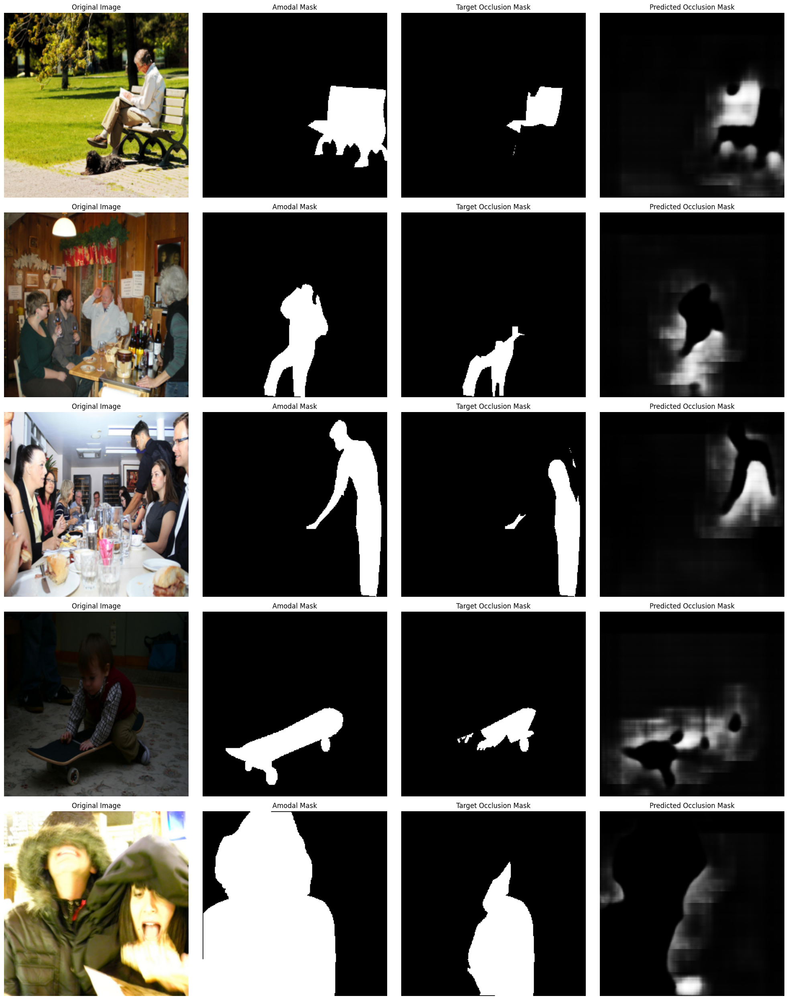

In [55]:
visualize_predictions(model_CNN_Occlusion, test_loader, device, num_samples=5)

### Amodal Segmentation

#### Defining CNN Network

The network used here is similar to the one specified in the amodal occlusion part, differing only in:

* The number of channels used: unlike the amodal occlusion network, which uses a single mask, this network requires two masks for training. Consequently, the input channel count is adjusted accordingly.
* The forward method: in this network, the modal mask and the occlusion boundary are concatenated along the channel dimension. This expands on the forward method of the amodal occlusion network, where only the image and the modal mask were concatenated.

In [56]:
class SimpleCNN_Segmentation(nn.Module):
    def __init__(self, n_channels=5, n_classes=1):
        super(SimpleCNN_Segmentation, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(n_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, n_classes, kernel_size=3, padding=1)
        )

    def forward(self, image, modal_mask, occlusion_boundary):
        x = torch.cat([image, modal_mask, occlusion_boundary], dim=1)
        x = self.encoder(x)
        x = self.decoder(x)
        return x

#### Training

In [57]:
from pickle import DICT

model_CNN_Segmentation = SimpleCNN_Segmentation(n_channels=5, n_classes=1).to(device)
#optimizer_amodal = torch.optim.AdamW(model_CNN_Segmentation.parameters(), lr=1e-4, weight_decay=1e-2)
optimizer_amodal = torch.optim.Adam(model_CNN_Segmentation.parameters(), lr=1e-4)
criterion = BCEDiceLoss()

num_epochs = 20
for epoch in range(num_epochs):
    model_CNN_Segmentation.train()
    for images, modal_masks, occlusion_masks, occlusion_boundary_masks, amodal_masks in train_loader:
        images = images.to(device)
        modal_masks = modal_masks.to(device)
        occlusion_boundary_masks = occlusion_boundary_masks.to(device)
        amodal_masks = amodal_masks.to(device)
        optimizer_amodal.zero_grad()
        outputs = model_CNN_Segmentation(images, modal_masks, occlusion_boundary_masks)
        loss = criterion(outputs, amodal_masks)
        loss.backward()
        optimizer_amodal.step()

    print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item()}')


Epoch 1/20, Loss: 0.3704184293746948
Epoch 2/20, Loss: 0.4432043731212616
Epoch 3/20, Loss: 0.4003181457519531
Epoch 4/20, Loss: 0.4543132185935974
Epoch 5/20, Loss: 0.1588781177997589
Epoch 6/20, Loss: 0.10630783438682556
Epoch 7/20, Loss: 0.11583351343870163
Epoch 8/20, Loss: 0.2305866777896881
Epoch 9/20, Loss: 0.15584370493888855
Epoch 10/20, Loss: 0.20706675946712494
Epoch 11/20, Loss: 0.27166932821273804
Epoch 12/20, Loss: 0.2545546293258667
Epoch 13/20, Loss: 0.1256883591413498
Epoch 14/20, Loss: 0.24259424209594727
Epoch 15/20, Loss: 0.4319092929363251
Epoch 16/20, Loss: 0.1429067850112915
Epoch 17/20, Loss: 0.16034016013145447
Epoch 18/20, Loss: 0.14037391543388367
Epoch 19/20, Loss: 0.24814674258232117
Epoch 20/20, Loss: 0.146240234375


#### Testing

In [58]:
import torch

def compute_iou(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    if union == 0:
        return 0.0
    else:
        return intersection / union

def compute_dice(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    intersection = (pred * target).sum()
    dice = (2 * intersection) / (pred.sum() + target.sum())
    if (pred.sum() + target.sum()) == 0:
        return 0.0
    else:
        return dice

def evaluate_model_segmentation(model, test_loader, device):
    model.eval()
    total_iou = 0.0
    total_dice = 0.0
    num_batches = 0

    with torch.no_grad():
        for images, modal_masks, occlusion_masks, occlusion_boundary_masks, amodal_masks in test_loader:
            images = images.to(device)
            modal_masks = modal_masks.to(device)
            occlusion_boundary_masks = occlusion_boundary_masks.to(device)
            amodal_masks = amodal_masks.to(device)

            outputs = model(images, modal_masks, occlusion_boundary_masks)
            outputs = torch.sigmoid(outputs)  # applying sigmoid to obtain probabilities
            binary_outputs = (outputs > 0.5).float()  # applying tresholf to obtain a binary mask

            batch_iou = 0.0
            batch_dice = 0.0
            for i in range(images.size(0)):
                iou = compute_iou(binary_outputs[i], amodal_masks[i])
                dice = compute_dice(binary_outputs[i], amodal_masks[i])
                batch_iou += iou
                batch_dice += dice

            total_iou += batch_iou / images.size(0)
            total_dice += batch_dice / images.size(0)
            num_batches += 1

    mean_iou = total_iou / num_batches
    mean_dice = total_dice / num_batches
    inverse_miou = 1 - mean_iou

    print(f'Mean IoU: {mean_iou:.4f}')
    print(f'Mean Dice Coefficient: {mean_dice:.4f}')
    print(f'Inverse Mean IoU: {inverse_miou:.4f}')

    return mean_iou, mean_dice, inverse_miou

In [59]:
mean_iou_CNN_Segmentation, mean_dice_CNN_Segmentation, inverse_miou_CNN_Segmentation = evaluate_model_segmentation(model_CNN_Segmentation, test_loader, device)

Mean IoU: 0.7875
Mean Dice Coefficient: 0.8718
Inverse Mean IoU: 0.2125


#### Visualization

In [60]:
def visualize_predictions_amodal(model, test_loader, device, num_samples=5):
    model.eval()
    samples = random.sample(range(len(test_loader.dataset)), num_samples)

    fig, axes = plt.subplots(num_samples, 4, figsize=(20, num_samples * 5))
    if num_samples == 1:
        axes = axes[np.newaxis, :]

    with torch.no_grad():
        for i, idx in enumerate(samples):
            image, modal_mask, occlusion_mask, occlusion_boundary_mask, amodal_mask = test_loader.dataset[idx]
            image = image.to(device).unsqueeze(0)
            modal_mask = modal_mask.to(device).unsqueeze(0)
            occlusion_boundary_mask = occlusion_boundary_mask.to(device).unsqueeze(0)
            amodal_mask = amodal_mask.to(device).unsqueeze(0)

            output = model(image, modal_mask, occlusion_boundary_mask)
            output = torch.sigmoid(output).squeeze().cpu().numpy()
            binary_output = (output > 0.5).astype(np.uint8)  # trashold for binary mask

            # Convert tensors to numpy arrays for visualization
            image_np = image.squeeze().permute(1, 2, 0).cpu().numpy()
            modal_mask_np = modal_mask.squeeze().cpu().numpy()
            amodal_mask_np = amodal_mask.squeeze().cpu().numpy()

            axes[i, 0].imshow(image_np)
            axes[i, 0].set_title("Original Image")
            axes[i, 0].axis('off')

            axes[i, 1].imshow(modal_mask_np, cmap='gray')
            axes[i, 1].set_title("Modal Mask")
            axes[i, 1].axis('off')

            axes[i, 2].imshow(amodal_mask_np, cmap='gray')
            axes[i, 2].set_title("Target Amodal Mask")
            axes[i, 2].axis('off')

            axes[i, 3].imshow(binary_output, cmap='gray')
            axes[i, 3].set_title("Predicted Amodal Mask")
            axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

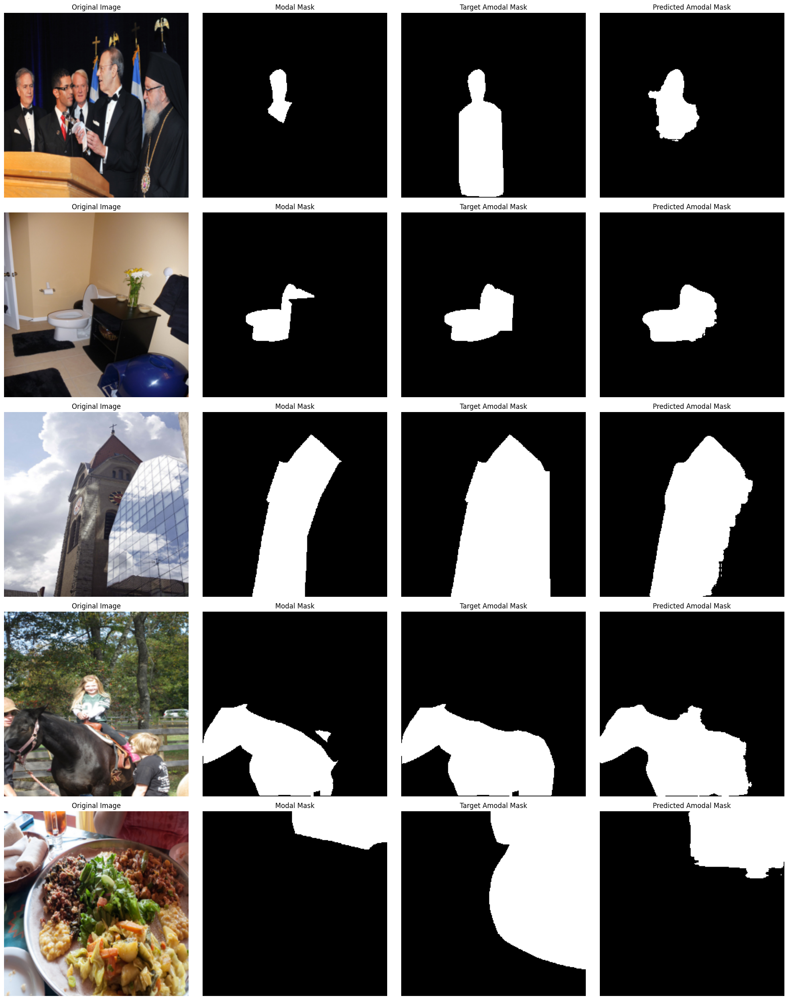

In [61]:
visualize_predictions_amodal(model_CNN_Segmentation, test_loader, device, num_samples=5)

### Occlusion Boundaries Computation

In [62]:
new_test_dataset = generate_new_test_dataset(model_CNN_Occlusion, test_loader, device)

#### Visualization of the predicted occlusion boundaries

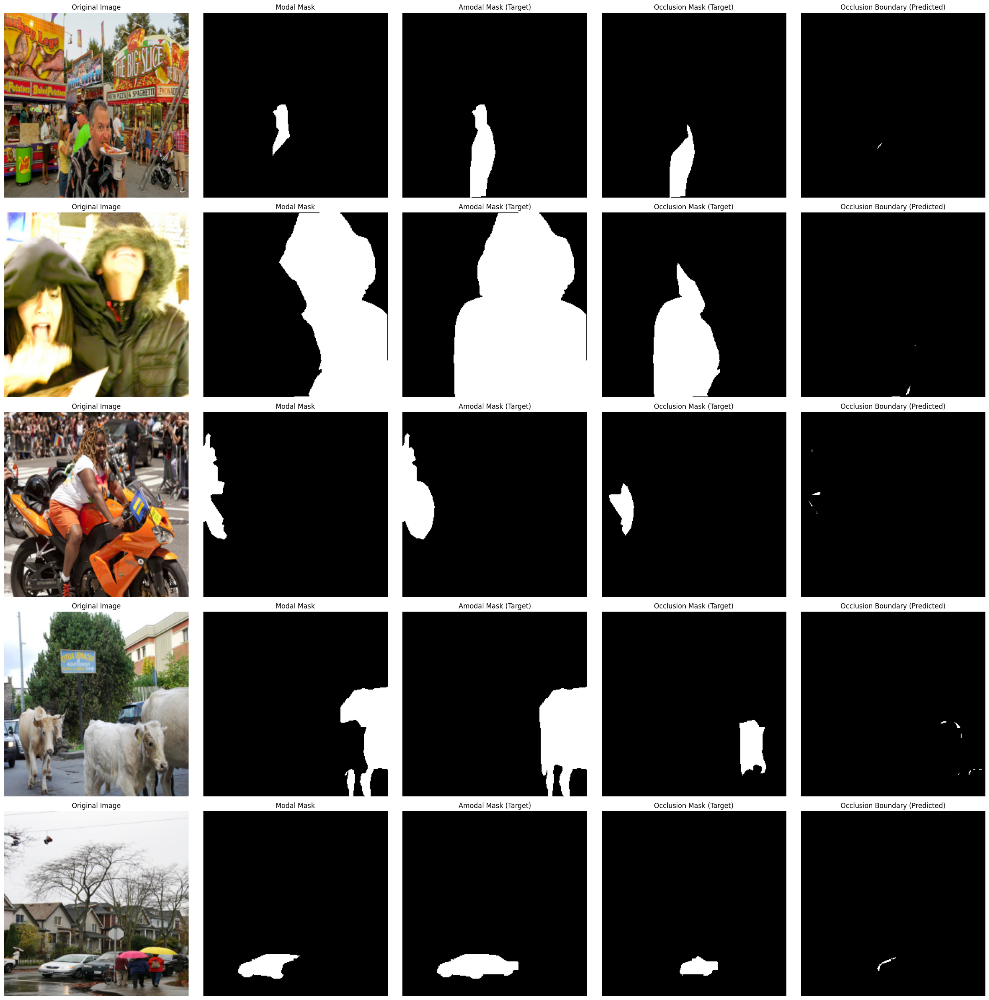

In [63]:
visualize_new_predictions(new_test_dataset, num_samples=5)

## Final results

In [64]:
new_test_loader_CNN = DataLoader(new_test_dataset, batch_size=16, shuffle=True)

final_mean_iou_CNN_Segmentation, final_mean_dice_CNN_Segmentation, final_inverse_miou_CNN_Segmentation = evaluate_model_segmentation(model_CNN_Segmentation, new_test_loader_CNN, device)

Mean IoU: 0.6820
Mean Dice Coefficient: 0.7916
Inverse Mean IoU: 0.3180


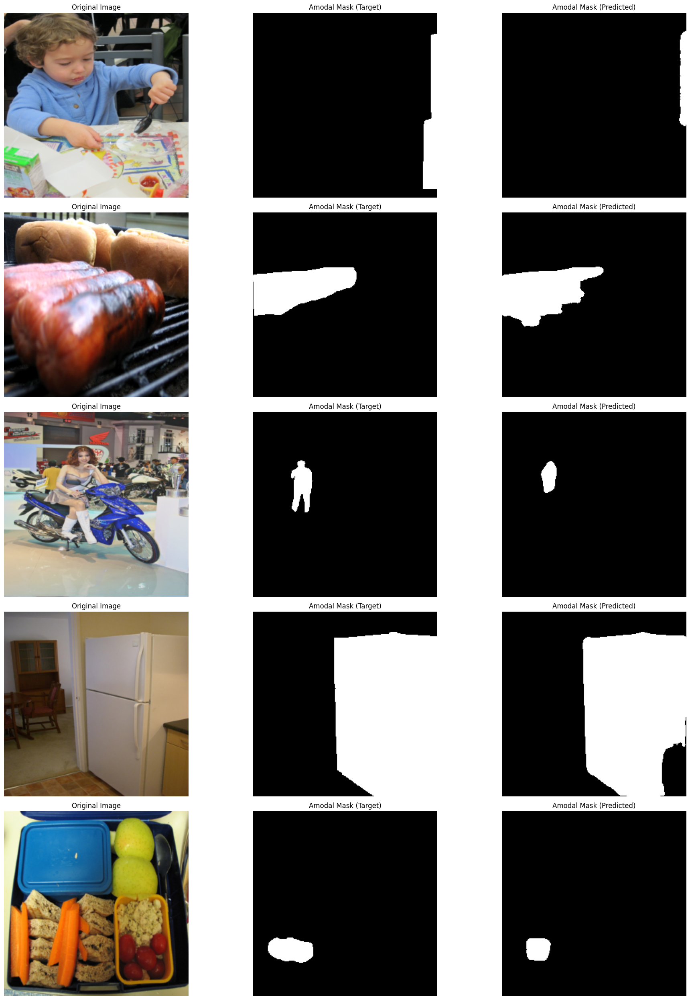

In [65]:
visualize_amodal_predictions(model_CNN_Segmentation, new_test_loader_CNN, device, num_samples=5)


## Table of Results

Below, the results table is presented. It includes:
* Results of the amodal occlusion for the UNet and CNN models
* Results of the amodal segmentation for the UNet and CNN models
* Final results of the UNet and CNN models

In [66]:
data = [
    ["UNet", f"{mean_iou_UNet:.2f}", f"{mean_dice_UNet:.2f}", f"{inverse_miou_UNet:.2f}"],
    ["AmodalUNet", f"{mean_iou_AmodalUNet:.2f}", f"{mean_dice_AmodalUNet:.2f}", f"{inverse_miou_AmodalUNet:.2f}"],
    ["AmodalUNet (final)", f"{final_mean_iou_AmodalUNet:.2f}", f"{final_mean_dice_AmodalUNet:.2f}", f"{final_inverse_miou_AmodalUNet:.2f}"],
    ["CNN Occlusion", f"{mean_iou_CNN_Occlusion:.2f}", f"{mean_dice_CNN_Occlusion:.2f}", f"{inverse_miou_CNN_Occlusion:.2f}"],
    ["CNN Segmentation", f"{mean_iou_CNN_Segmentation:.2f}", f"{mean_dice_CNN_Segmentation:.2f}", f"{inverse_miou_CNN_Segmentation:.2f}"],
    ["CNN Segmentation (final)", f"{final_mean_iou_CNN_Segmentation:.2f}", f"{final_mean_dice_CNN_Segmentation:.2f}", f"{final_inverse_miou_CNN_Segmentation:.2f}"]
]

header = ["Model", "Mean IoU", "Mean Dice Coefficient", "Inverse Mean IoU"]

def print_table(header, data):
    col_widths = [max(len(str(item)) for item in col) for col in zip(header, *data)]

    format_str = " | ".join(f"{{:<{width}}}" for width in col_widths)

    print(format_str.format(*header))
    print("-+-".join('-' * width for width in col_widths))

    for row in data:
        print(format_str.format(*row))

print_table(header, data)

Model                    | Mean IoU | Mean Dice Coefficient | Inverse Mean IoU
-------------------------+----------+-----------------------+-----------------
UNet                     | 0.43     | 0.55                  | 0.57            
AmodalUNet               | 0.83     | 0.90                  | 0.17            
AmodalUNet (final)       | 0.75     | 0.84                  | 0.25            
CNN Occlusion            | 0.28     | 0.40                  | 0.72            
CNN Segmentation         | 0.79     | 0.87                  | 0.21            
CNN Segmentation (final) | 0.68     | 0.79                  | 0.32            


#### Graphical results visualization

In [67]:
def overlay_mask_on_image(image, mask, color=[1, 0, 0], alpha=0.5):
    """
    Sovrapponi una maschera all'immagine.

    Args:
    - image (numpy array): Immagine originale.
    - mask (numpy array): Maschera binaria.
    - color (list): Colore della maschera sovrapposta (default: rosso).
    - alpha (float): Trasparenza della maschera sovrapposta (default: 0.5).

    Returns:
    - overlayed_image (numpy array): Immagine con maschera sovrapposta.
    """
    overlay = image.copy()
    mask = mask.astype(bool)
    overlay[mask] = (1 - alpha) * overlay[mask] + alpha * np.array(color)
    return overlay

def visualize_amodal_predictions_comparison(model1, model2, test_loader1, test_loader2, device, num_samples=5):
    model1.eval()
    model2.eval()
    samples = random.sample(range(len(test_loader1.dataset)), num_samples)

    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 5))
    if num_samples == 1:
        axes = axes[np.newaxis, :]

    with torch.no_grad():
        for i, idx in enumerate(samples):
            image1, modal_mask1, _, occlusion_boundary_mask1, _ = test_loader1.dataset[idx]
            image2, modal_mask2, _, occlusion_boundary_mask2, _ = test_loader2.dataset[idx]

            # Predizione con il primo modello
            image1 = image1.to(device).unsqueeze(0)
            modal_mask1 = modal_mask1.to(device).unsqueeze(0)
            occlusion_boundary_mask1 = occlusion_boundary_mask1.to(device).unsqueeze(0)
            output1 = model1(image1, modal_mask1, occlusion_boundary_mask1)
            output1 = torch.sigmoid(output1).squeeze().cpu().numpy()
            binary_output1 = (output1 > 0.5).astype(np.uint8)

            # Predizione con il secondo modello
            image2 = image2.to(device).unsqueeze(0)
            modal_mask2 = modal_mask2.to(device).unsqueeze(0)
            occlusion_boundary_mask2 = occlusion_boundary_mask2.to(device).unsqueeze(0)
            output2 = model2(image2, modal_mask2, occlusion_boundary_mask2)
            output2 = torch.sigmoid(output2).squeeze().cpu().numpy()
            binary_output2 = (output2 > 0.5).astype(np.uint8)

            # Converti i tensori in array numpy per la visualizzazione
            image1_np = image1.squeeze().permute(1, 2, 0).cpu().numpy()
            image2_np = image2.squeeze().permute(1, 2, 0).cpu().numpy()

            # Visualizzazione
            axes[i, 0].imshow(image1_np)
            axes[i, 0].set_title("Original Image")
            axes[i, 0].axis('off')

            overlayed_image1 = overlay_mask_on_image(image1_np, binary_output1)
            axes[i, 1].imshow(overlayed_image1)
            axes[i, 1].set_title("Model 1 Prediction")
            axes[i, 1].axis('off')

            overlayed_image2 = overlay_mask_on_image(image2_np, binary_output2)
            axes[i, 2].imshow(overlayed_image2)
            axes[i, 2].set_title("Model 2 Prediction")
            axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

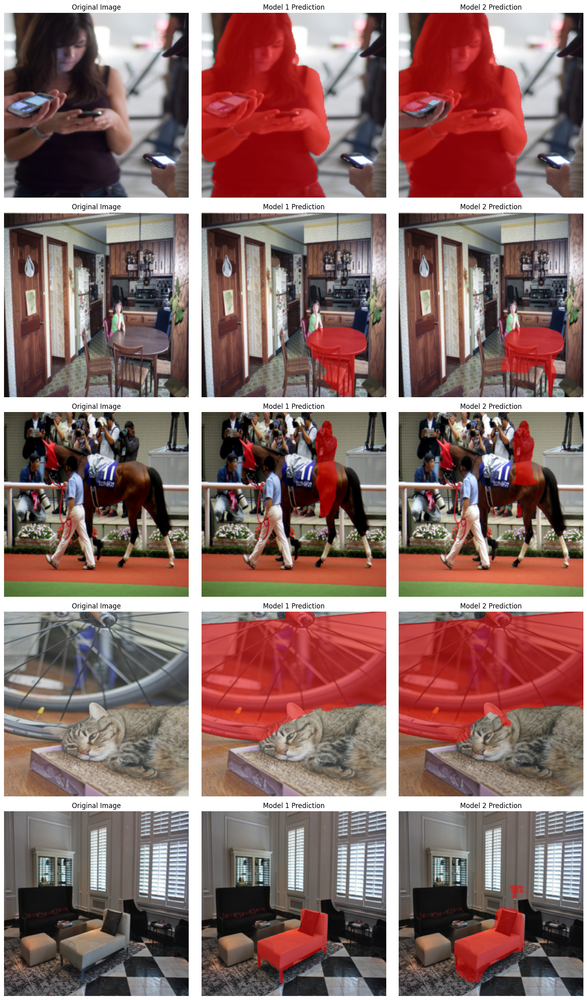

In [69]:
visualize_amodal_predictions_comparison(model_AmodalUNet, model_CNN_Segmentation, new_test_loader_UNet, new_test_loader_CNN, device, num_samples=5)